# Тестовое задание - ecom.tech - Data scientist - временные ряды 
**Автор: Владимир Лузин**

План:
- EDA
- Prophet Baseline с подбором гиперпараметров
- Кластеризация временных рядов
- Создание признаков
- Отбор признаков
- Global boosting forecast с подбором гиперпараметров
- Выводы

Кратко о выполненных критериях:
1. Метрика качества
Не получилось добиться хорошего качества
По всем рядам была достигнута среднее sMAE 

2. EDA
Были изучены ряды в целом и предложены возможные модели.
На этапе EDA была построена гипотеза о возможной причине пропусков и предложены варианты их заполнения.
Была предложена гипотеза о кластеризация рядов для улучшения качества модели.
Также я предположил, что модели связаны между собой и может быть выгодно использовать глобальные модели прогнозирования.

3. Качество кода
Код прокомментирован, структурирован по частям, важные вещи вынесены в функции.

4. Создание и отбор фичей
Были созданы экзогенные фичи различных аспектов даты и времени (месяц, квартал, день недели и т.д.), которые затем были циклично закодированы. Также были добавлены признаки восхода и заката солнца, продолжительности светового дня. Возможно стоило добавить ещё признаки выходных, но в задании ничего не было сказано о местоположении магазинов, так что для продолжительности светового дня я произвольно выбрал Москву.
Для отбора фичей я использовал рекурсивное исключение признаков с кросс-валидацией и моделью LGBMRegressor. Признаков у меня было немного, поэтому удалось удалить только 5 лишних признаков.

5. Выбор модели
В качестве бэйзлайна я сначала локально использовал статистическую модель Prophet и подобрал к ней параметры на кросс-валидации.
Получилось выбить sMAE = 0.62. Затем эту модель я использовал для заполнения пропусков.
Затем для прогнозирования я решил использовать глобальную модель, поскольку на этапе EDA я решил, что ряды связаны между собой и извлечение общего паттерна может помочь в прогнозировании и уменьшении переобучения. К тому же это уменьшит время на обучение и подбор гиперпараметров. Я использовал рекурсивную модель на основе бустинга LightGBM, к которой я подобрал на отложенной, валидационной, выборке. Такой моделью я смог выбить на кросс-валидации sMAE = 0.54.
После подбора гиперпарпараметров для бустинга я обучил ансамбль из 5 моделей, но это не дало улучшений качества.
DL модели я обучать не стал, поскольку данных для обучения слишком мало,
а zero-shot модели показали плохой результат (пробовал использовать Chronos, который показал себя хуже чем Prophet)

6. Стратегия валидации
Для валидации я использовал Кросс-валидацию с расширяющимся окном, то есть модель обучается на растущем объеме данных, начиная с первой точки, и каждый раз тестируется на следующем отрезке данных. Причиной выбора данной стратегии стало то, что она лучше всего подходит для задачи классического прогнозирования временного ряда, поскольку для предсказания реальных результатов модель обучается на всех предыдущих данных, а не только на каком-то окне. Кроме того, такая стратегия помогает избежать утечек данных, так как в каждом шаге тестирование выполняется на "будущих" данных относительно обучающих, что соответствует реальному сценарию, где мы предсказываем значения на основе доступных исторических данных.

7. Выбор гиперпараметров
Для всех моделей подбирались гиперпараметры
Для Prophet использовалась кросс-валидация с расширающимся окном и grid-search. Это одновременно самый надёжный и трудоёмкий вариант подбора гиперпараметров, поскольку grid-search перебирает все выбранные комбинации вариантов. Такой способ был выбран из-за быстродействия модели, небольшого размера выборки и количества перебираемых параметров. 
Для Глобальной модели бустинга гиперпараметры подбирались на отложенной (holdout), валидационной, выборке с использованием bayesian search. Такой способ был выбран поскольку модель обучается долго и имеет огромное количество возможных сочетаний гиперпараметров. Отложенная выборка работает гораздо быстрее кросс-валидации, поскольку модель для каждого теста обучается только один раз. bayesian search, в свою очередь, позволяет не перебирать все сочетания или рандомные комбинации гиперпараметров, а только самые перспективные варианты.

8. Выводы
В целом, получены весьма скверные результаты с sMAE = 0.54. 
Я могу это оправдать небольшим количеством данных, наличием большого количества пропусков и отсутствии информации о датасете (я не мог даже предположить геолокацию магазинов).
Подробнее в конце ноутбука
Подробнее в конце ноутбука

## Загрузка данных

In [11]:
# Работа с данными 
import pandas as pd
import numpy as np
from scipy import stats

# Стандартные библиотеки
import logging
import os, sys
import itertools

# Визуализация
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from pandas.plotting import autocorrelation_plot
from statsmodels.tsa.seasonal import STL
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

# Prophet
import prophet
from sktime.forecasting.fbprophet import Prophet

# Заполнение пропусков
from sktime.transformations.series.impute import Imputer

# Выделение признаков
import tsfresh
from tsfresh import extract_features
from tsfresh import select_features
from tsfresh.feature_extraction.settings import ComprehensiveFCParameters
from feature_engine.datetime import DatetimeFeatures
from astral.sun import sun
from astral import LocationInfo

# Отбор признаков
from sklearn.feature_selection import RFECV

# Кластеризация
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# Прогнозированиес skforecast
from lightgbm import LGBMRegressor
from skforecast.ForecasterAutoregMultiSeries import ForecasterAutoregMultiSeries
from skforecast.model_selection_multiseries import backtesting_forecaster_multiseries
from skforecast.model_selection_multiseries import bayesian_search_forecaster_multiseries
from skforecast.model_selection_multiseries import select_features_multiseries
from skforecast.preprocessing import series_long_to_dict
from skforecast.preprocessing import exog_long_to_dict

# Стакинг
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import Ridge
from sklearn.linear_model import ElasticNet
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.ensemble import StackingRegressor
from sklearn.model_selection import KFold

# Скрою предупреждения
import warnings
warnings.filterwarnings("ignore")

In [5]:
def sMAE(y_true, y_pred):
    '''
    Standardised mean absolute error metric
    '''
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    # MAE
    mae = np.mean(np.abs(y_true - y_pred))

    # std
    std_dev = np.std(y_true)

    # деление на 0
    if std_dev == 0:
        raise ValueError("Standard deviation of actual values is zero; sMAE cannot be computed.")

    # sMAE
    sMAE_value = mae / std_dev

    return sMAE_value

In [6]:
df = pd.read_excel("train.xlsx")
test = pd.read_excel("test.xlsx")

In [7]:
df = df.rename(columns={"id": "store_id", "dt": "date"})

In [8]:
df.head(5)

,store_id,date,target
0,0,2016-01-02,747.8
1,0,2016-01-03,681.2
2,0,2016-01-04,505.8
3,0,2016-01-06,1078.3
4,0,2016-01-07,961.9


In [9]:
df.shape  # Данных немного

(7725, 3)

In [10]:
df.groupby("store_id").count().shape  # 20 магазинов

(20, 2)

## EDA
Для начала рассмотрю все ряды в целом.
Из графиков ниже сразу можно увидеть наличие пропусков в одно и то же время с 2016-07 по 2017-01, которые скорее всего свидетельствуют о том, что магазин в это время не работал и, вероятно, такие значения стоит заполнять нулями. Такая проблема наблюдается в 5 из 20 графиков
Также можно увидеть, что значение таргета в основном распределено около 500, что говорит о возможной связи между рядами (обучение на одном ряде может помочь в предсказании другого)
Большинство магазинов довольно похожи, но в некоторых значения таргета меньше, а в одном значительно больше (магазин 8). Возможно стоит разделить временные ряды на 3-4 кластера и создать для каждого свою модель или хотя бы добавить информацию о кластерах как экзогенную переменную.
Ряды выглядят стационарными. На первый взгляд ряды обладают сезонностью без тренда.

In [11]:
sns.set(style="whitegrid")

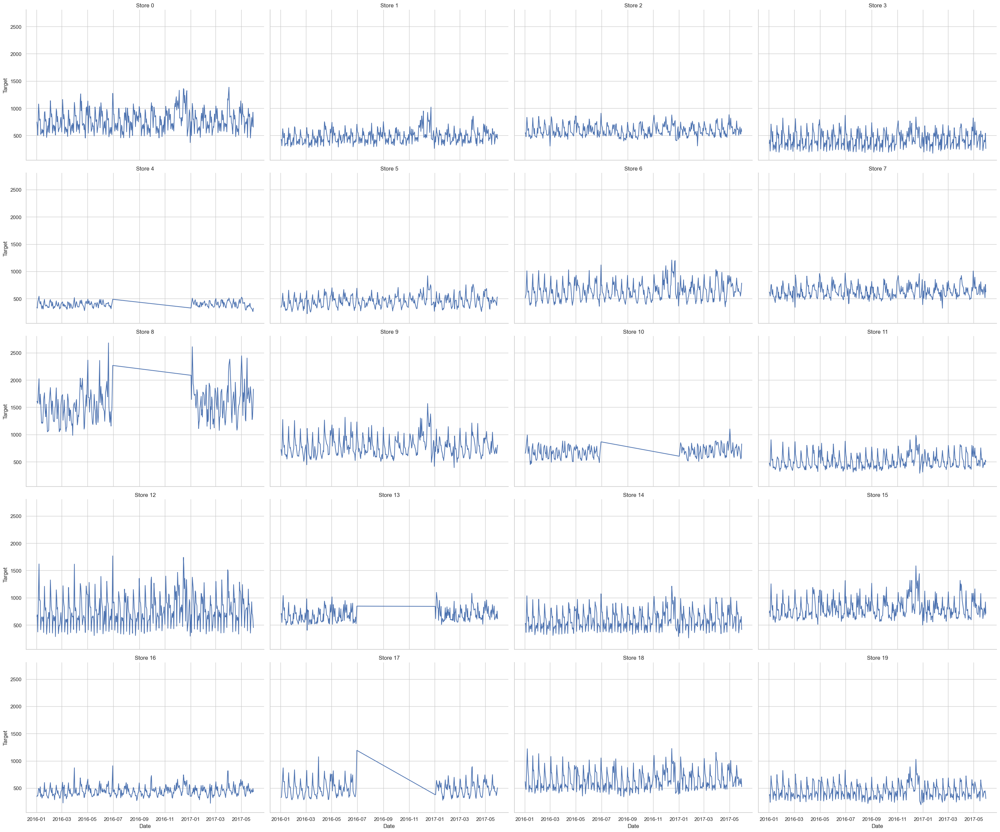

In [12]:
g = sns.FacetGrid(df, col="store_id", col_wrap=4, height=5, aspect=1.5)

g.map_dataframe(sns.lineplot, x="date", y="target")

g.set_axis_labels("Date", "Target")
g.set_titles("Store {col_name}")
g.tight_layout()

plt.show()

Из распределения таргета также видно, что в основном значения лежат около 500 и имеют вид нормального распределения с небольшой правосторонней ассиметрией. 

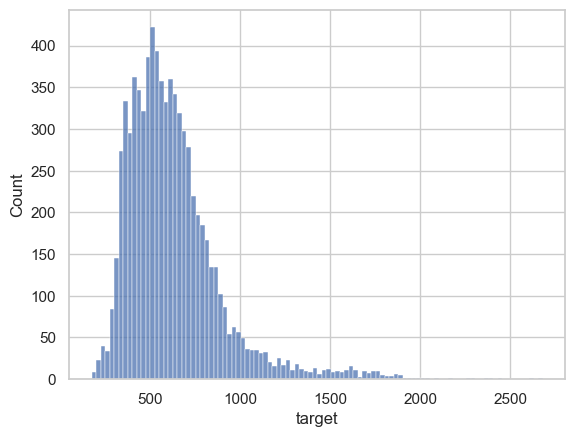

In [13]:
sns.histplot(df.target, bins=100)

plt.show()

In [14]:
df.isna().sum()  # Пропущенных значений нет

store_id    0
date        0
target      0
dtype: int64

Интервалы между информацией о продаже лежат между 1 и 3 днями. 186 дней это один большой пропуск, в который 5 магазинов, видимо были закрыты. То есть пропускаются от 1 до 2 дней.

In [15]:
df['time_interval'] = df['date'] - df.groupby('store_id')['date'].shift(1)
df['time_interval'] = df['time_interval'].fillna(pd.Timedelta(days=1))  # Буду считать первый день за интервал 1


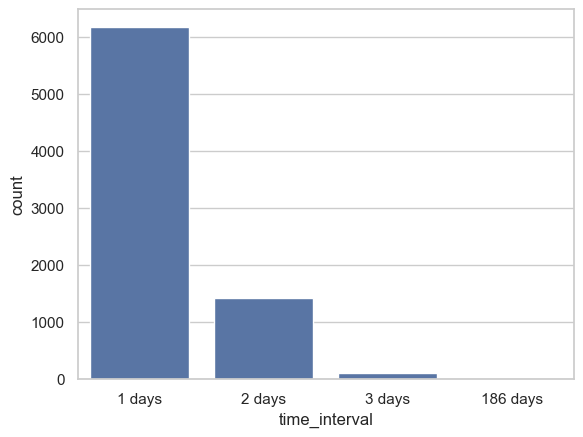

In [16]:
sns.barplot(df['time_interval'].value_counts())

plt.show()

Если рассмотреть то, какие дни чаще всего пропускаются - то это среда и четверг. Возможно в эти дни магазины закрыты или менеджер отправляет в четверг и пятницу сразу за 2-3 дня (из-за постоянства пропусков у всех магазинов я всё же склоняюсь к выходному) 

In [17]:
interval_count = df.groupby(df["date"].dt.dayofweek)["time_interval"].value_counts().unstack(fill_value=0)
days_of_week = {
    0: 'Понедельник',
    1: 'Вторник',
    2: 'Среда',
    3: 'Четверг',
    4: 'Пятница',
    5: 'Суббота',
    6: 'Воскресенье'
}
interval_count.index = interval_count.index.map(days_of_week)
interval_count

time_interval,1 days,2 days,3 days,186 days
date,,,,
Понедельник,1144,90,0,5
Вторник,1074,96,15,0
Среда,0,153,0,0
Четверг,153,1081,12,0
Пятница,1234,0,84,0
Суббота,1337,7,0,0
Воскресенье,1239,1,0,0


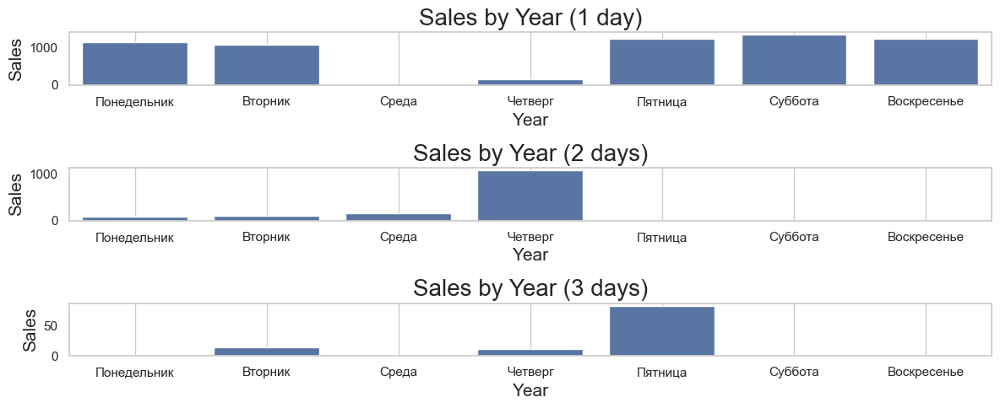

In [18]:
fig, axes = plt.subplots(3, 1, figsize=(12, 5))

sns.barplot(x=interval_count.index, y=interval_count["1 days"], ax=axes[0])
axes[0].set_title('Sales by Year (1 day)', fontsize=20)
axes[0].set_xlabel('Year', fontsize=15)
axes[0].set_ylabel('Sales', fontsize=15)
axes[0].grid()

sns.barplot(x=interval_count.index, y=interval_count["2 days"], ax=axes[1])
axes[1].set_title('Sales by Year (2 days)', fontsize=20)
axes[1].set_xlabel('Year', fontsize=15)
axes[1].set_ylabel('Sales', fontsize=15)
axes[1].grid()

sns.barplot(x=interval_count.index, y=interval_count["3 days"], ax=axes[2])
axes[2].set_title('Sales by Year (3 days)', fontsize=20)
axes[2].set_xlabel('Year', fontsize=15)
axes[2].set_ylabel('Sales', fontsize=15)
axes[2].grid()

plt.tight_layout()

plt.show()

Также рассмотрю какие значения принимал таргет в зависимости от пропущенных до него дней (оранжевый - пропущен 1 день, зелёный - пропущено 2 дня). 
Из графиков видно, что после пропущенных дней количество продаж всегда увеличивается, по сравнению с предыдущим зарегистрированным днём, то есть это не ошибка в данных, а "выходной" или день инвентаризации, что подтверждается цикличностью этих пропусков (каждые 5-6 дней).

Насчёт заполнения заполнения пропусков. В реальности скорее всего на месте этих пропусков будут нули, тем не менее, я не буду заполнять пропуски нулями, поскольку это может сильно увеличить переобучение.  Для заполнения пропусков я планирую использовать простую статистическую модель вроде Prophet с подбором её гиперпараметров. Возможно также стоит попробовать использовать модели, в которых пропуски допустимы (бустинги, модели глубинного обучения). 
То, будут ли на месте пропусков нули в реальных данных уже стоит уточнять у заказчика, но за неимением информации о данных предпочту не допустить переобучения на остальных значениях.

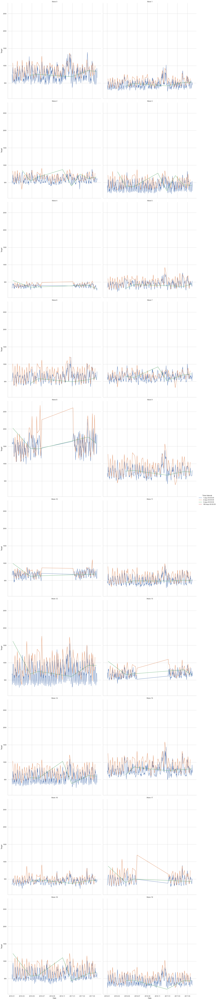

In [19]:
temp_df = df.copy()
temp_df['time_interval'] = temp_df['time_interval'].astype('category')

g = sns.FacetGrid(temp_df, col="store_id", col_wrap=2, height=10, aspect=1)

g.map_dataframe(sns.lineplot, x="date", y="target", hue="time_interval")

g.set_axis_labels("Date", "Target")
g.set_titles("Store {col_name}")
g.tight_layout()
g.add_legend(title="Time Interval")

plt.show()

Добавлю пропущенные дни, оставив значения их целевой переменной как nan до этапа заполнения пропусков. Заодно оценю как распределяются эти пропуски на очередном графике.
На графике не видно однодневные "выходные", но можно увидеть, что двойные "выходные" во всех рядах происходят почти в одно и то же время. При этом двойные "выходные" раз в пол года случаются у всех магазинов, кроме 0, 1 и 15, а у магазинов 4, 8, 10, 12, 13, 17, 18 регулярно каждые пол года. Возможно можно разделить ряды на эти 3 кластера. (без инвентаризации, с регулярной инвентаризацией каждые пол года, и произвольной инвентаризацией)

In [20]:
def reindex_store(group):
    # Создаем полный диапазон дат от минимальной до максимальной даты для каждого магазина
    full_date_range = pd.date_range(start=group['date'].min(), end=group['date'].max(), freq='D')
    # Переиндексируем группу, чтобы включить все даты в диапазоне и добавить NaN для отсутствующих строк
    group = group.set_index('date').reindex(full_date_range).reset_index()
    group = group.rename(columns={'index': 'date'})
    # Добавляем колонку 'store_id', заполняя её идентификатором магазина
    group['store_id'] = group['store_id'].iloc[0]
    # Устанавливаем 'time_interval' в "0 days" только там, где 'target' имеет значение NaN
    group['time_interval'] = group['time_interval'].where(group['target'].notna(), "0 days")

    return group


# Применяем функцию переиндексации к каждому магазину
complete_df = df.groupby('store_id', as_index=False).apply(reindex_store).reset_index(drop=True)

complete_df

,date,store_id,target,time_interval
0,2016-01-02,0.0,747.8,1 days
1,2016-01-03,0.0,681.2,1 days
2,2016-01-04,0.0,505.8,1 days
3,2016-01-05,0.0,NaN,0 days
4,2016-01-06,0.0,1078.3,2 days
...,...,...,...,...
10295,2017-05-26,19.0,437.8,3 days
10296,2017-05-27,19.0,423.8,1 days
10297,2017-05-28,19.0,450.8,1 days
10298,2017-05-29,19.0,409.0,1 days


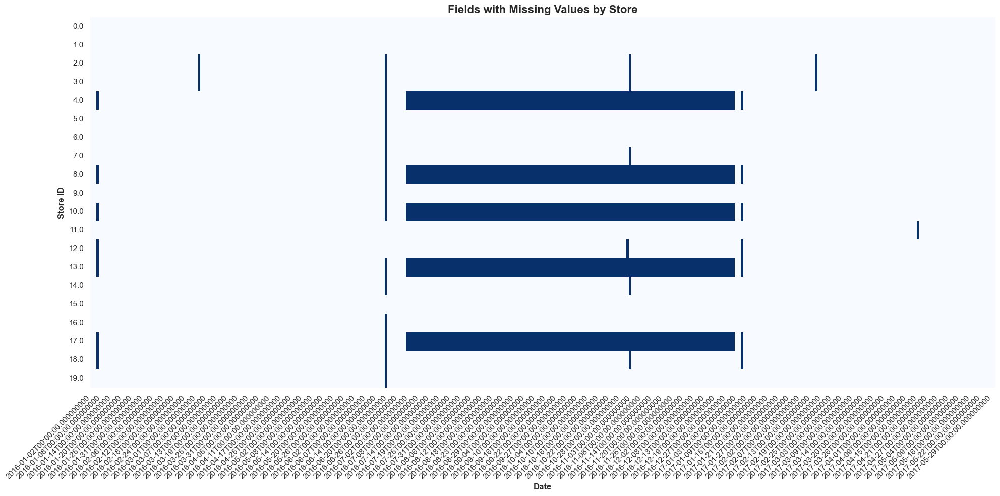

In [21]:
f, ax = plt.subplots(figsize=(20, 10))
heatmap_data = complete_df.pivot_table(index='store_id', columns='date', values='target')

sns.heatmap(heatmap_data.isna(), cmap='Blues', cbar=False, linewidths=0, linecolor='black')

ax.set_title('Fields with Missing Values by Store', fontsize=16, fontweight='bold')
ax.set_xlabel('Date', fontsize=12, fontweight='bold')
ax.set_ylabel('Store ID', fontsize=12, fontweight='bold')

plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)

plt.tight_layout()
plt.show()

In [22]:
complete_df[complete_df["store_id"] == 8.0]

,date,store_id,target,time_interval
4120,2016-01-02,8.0,1603.4,1 days
4121,2016-01-03,8.0,1608.6,1 days
4122,2016-01-04,8.0,1573.8,1 days
4123,2016-01-05,8.0,NaN,0 days
4124,2016-01-06,8.0,NaN,0 days
...,...,...,...,...
4630,2017-05-26,8.0,1587.4,3 days
4631,2017-05-27,8.0,1274.6,1 days
4632,2017-05-28,8.0,1319.4,1 days
4633,2017-05-29,8.0,1527.5,1 days


Из ящика с усами можно сделать вывод, что нельзя предсказать по году (по скольку данные даны всего за 1.5 года), но месяц и день недели могут дать полезную информацию, поэтому стоит использовать их в качестве экзогенных переменных.

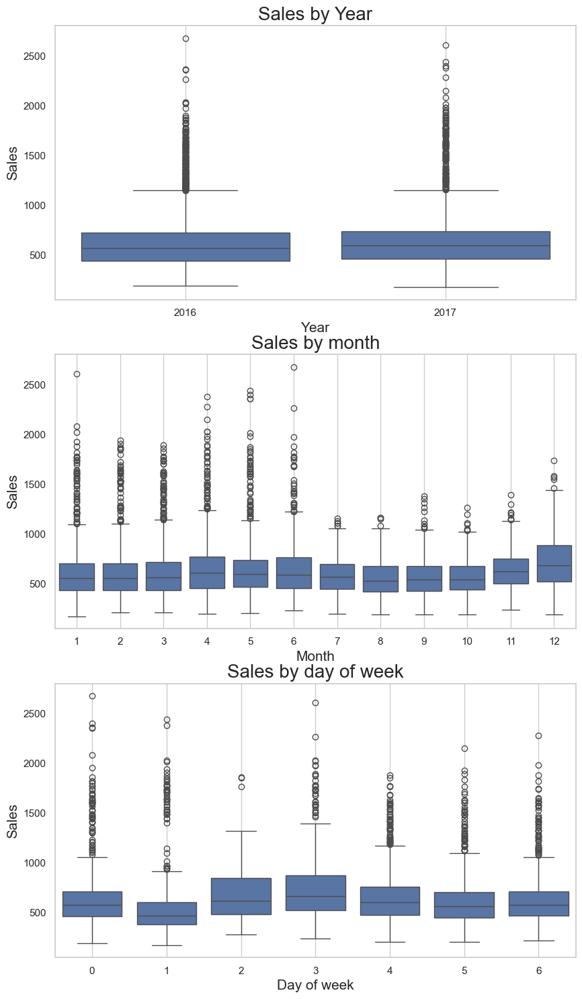

In [23]:
fig, axes = plt.subplots(3, 1, figsize=(10, 18))

sns.boxplot(x=df.date.dt.year, y=df.target, data=df, ax=axes[0])
axes[0].set_title('Sales by Year', fontsize=20)
axes[0].set_xlabel('Year', fontsize=15)
axes[0].set_ylabel('Sales', fontsize=15)
axes[0].grid()

sns.boxplot(x=df.date.dt.month, y=df.target, data=df, ax=axes[1])
axes[1].set_title('Sales by month', fontsize=20)
axes[1].set_xlabel('Month', fontsize=15)
axes[1].set_ylabel('Sales', fontsize=15)
axes[1].grid()

sns.boxplot(x=df.date.dt.dayofweek, y=df.target, data=df, ax=axes[2])
axes[2].set_title('Sales by day of week', fontsize=20)
axes[2].set_xlabel('Day of week', fontsize=15)
axes[2].set_ylabel('Sales', fontsize=15)
axes[2].grid()

plt.show()

при разложении нескольких временных рядов с помощью STL декомпозиции (буду рассматривать ряды 0, 2 и 12, так как они наиболее отличаются друг от друга и не имеют пропусков) можно увидеть, что все ряды имеют примерно одинаковый вид декомпозиции. У всех моделей тренд и сезонность выражены довольно слабо, остаточная составляющая носит довольно хаотичный характер, что может говорить о случайных отклонениях от тренда и сезонности

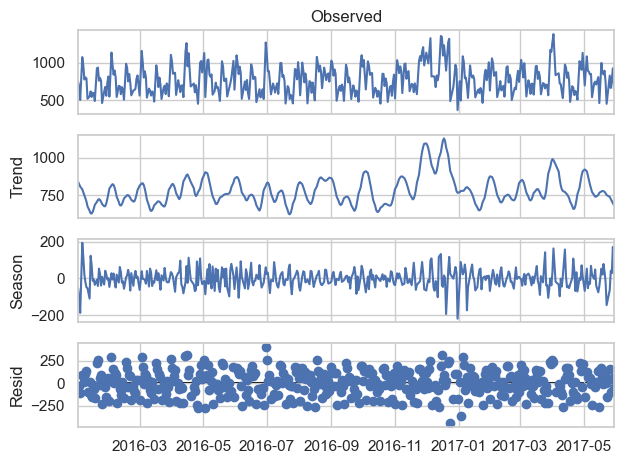

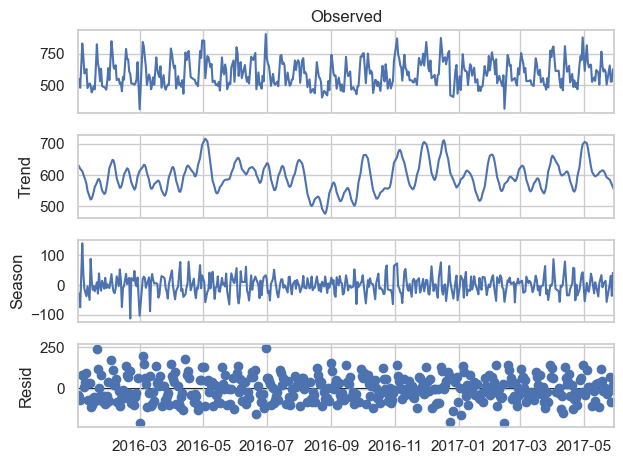

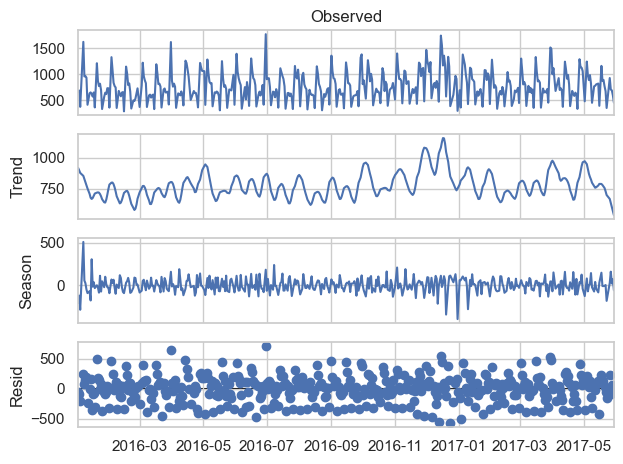

In [24]:
store_0_df = df[df["store_id"] == 0].set_index('date').drop(columns=["store_id", "time_interval"])
res0 = STL(store_0_df, period=7).fit()
res0.plot()

store_2_df = df[df["store_id"] == 2].set_index('date').drop(columns=["store_id", "time_interval"])
res2 = STL(store_2_df, period=7).fit()
res2.plot()

store_12_df = df[df["store_id"] == 12].set_index('date').drop(columns=["store_id", "time_interval"])
res12 = STL(store_12_df, period=7).fit()
res12.plot()

plt.show()

В графике автокорреляции можно увидеть, что ряды довольно похожи друг на друга. Ряды скорее всего стационарные.

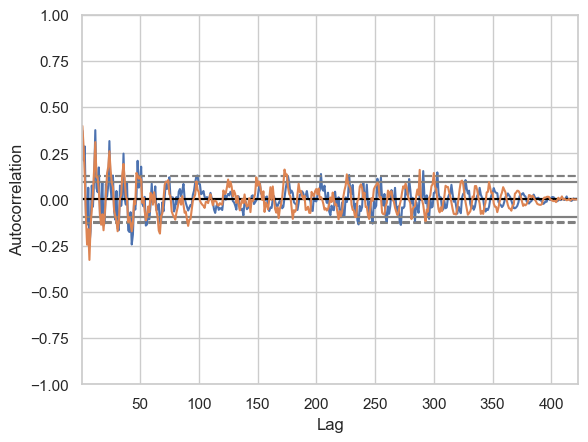

In [25]:
store_0_df = df[df["store_id"] == 0].set_index('date').drop(columns=["store_id", "time_interval"])
autocorrelation_plot(store_0_df)

store_2_df = df[df["store_id"] == 2].set_index('date').drop(columns=["store_id", "time_interval"])
autocorrelation_plot(store_2_df)
plt.show()

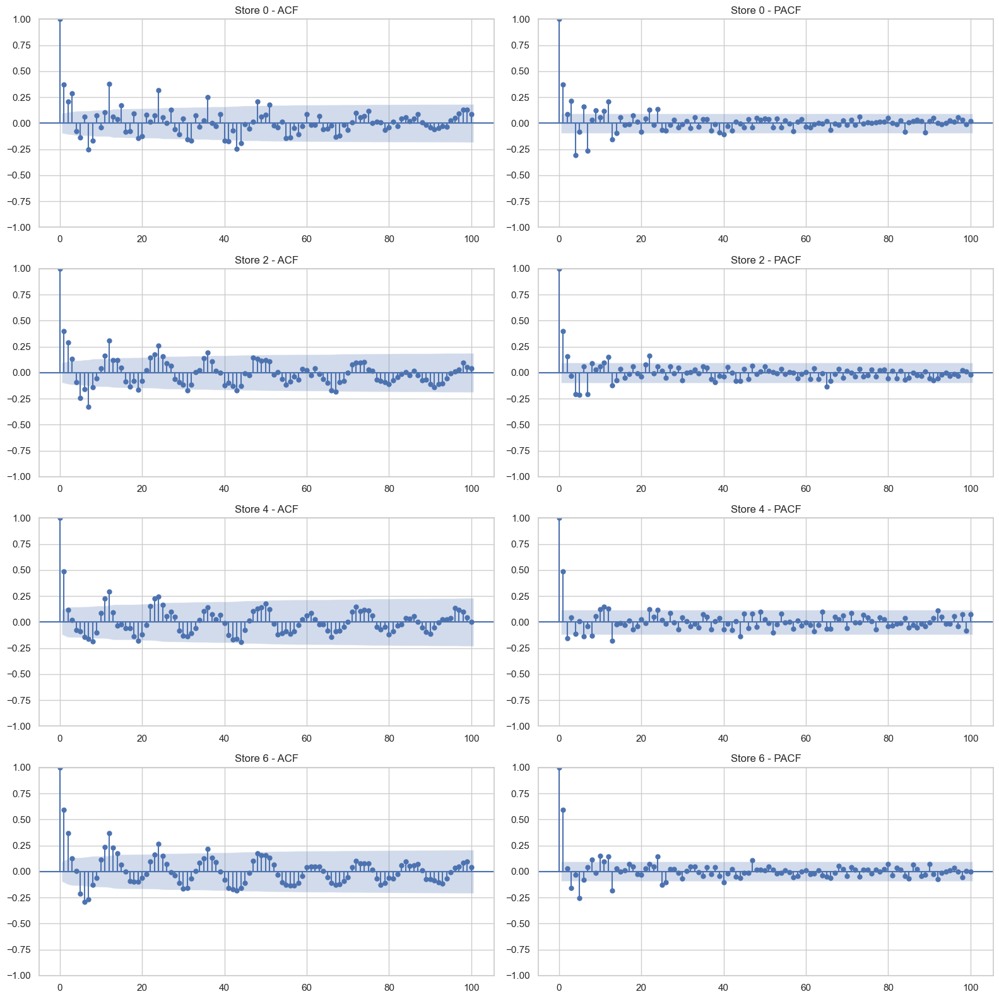

In [26]:
store_ids = [0, 2, 4, 6]

f, axes = plt.subplots(nrows=len(store_ids), ncols=2, figsize=(16, 4 * len(store_ids)))

for i, store_id in enumerate(store_ids):
    store_df = df[df["store_id"] == store_id].set_index('date').drop(columns=["store_id", "time_interval"])

    plot_acf(store_df, lags=100, ax=axes[i, 0])
    axes[i, 0].set_title(f'Store {store_id} - ACF')

    plot_pacf(store_df, lags=100, ax=axes[i, 1])
    axes[i, 1].set_title(f'Store {store_id} - PACF')

plt.tight_layout()
plt.show()

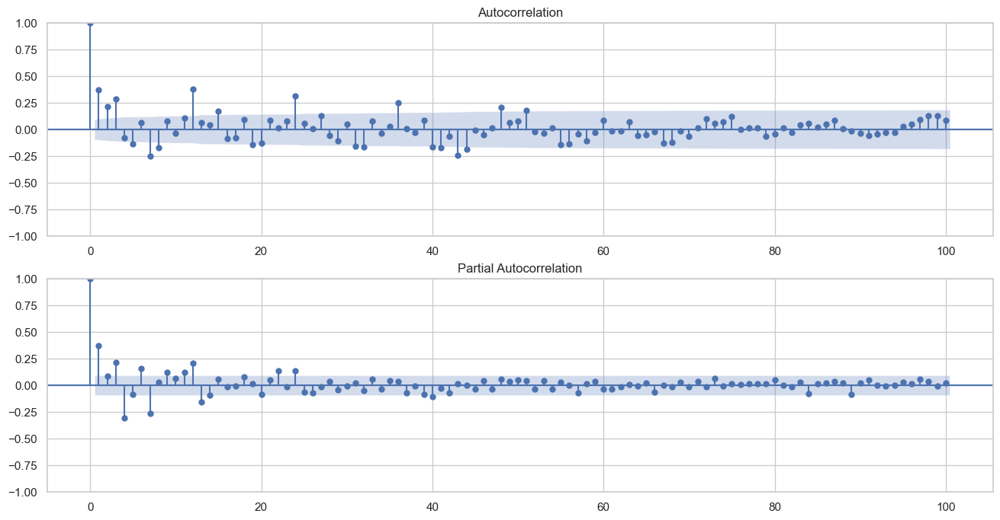

In [27]:
f, ax = plt.subplots(nrows=2, ncols=1, figsize=(16, 8))

store_0_df = df[df["store_id"] == 0].set_index('date').drop(columns=["store_id", "time_interval"])
plot_acf(store_0_df, lags=100, ax=ax[0])
plot_pacf(store_0_df, lags=100, ax=ax[1])
plt.show()

Из довольно высокой корреляции между магазинами можно заключить, что ряды довольно походи между собой (но не связаны). Поэтому глобальные модели могут быть довольно эффективны. 

In [28]:
store_0_df = df[df["store_id"] == 0].set_index('date').drop(columns=["store_id", "time_interval"]).rename(
    columns={"target": "store 0"})
store_1_df = df[df["store_id"] == 1].set_index('date').drop(columns=["store_id", "time_interval"]).rename(
    columns={"target": "store 1"})
store_2_df = df[df["store_id"] == 2].set_index('date').drop(columns=["store_id", "time_interval"]).rename(
    columns={"target": "store 2"})
store_12_df = df[df["store_id"] == 12].set_index('date').drop(columns=["store_id", "time_interval"]).rename(
    columns={"target": "store 12"})
store_15_df = df[df["store_id"] == 15].set_index('date').drop(columns=["store_id", "time_interval"]).rename(
    columns={"target": "store 15"})

merged_df = pd.concat([store_0_df, store_1_df, store_2_df, store_12_df, store_15_df], axis=1)

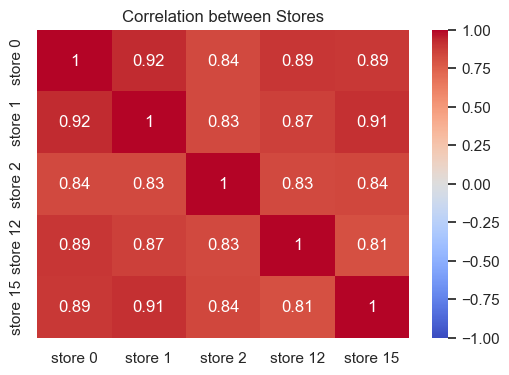

In [29]:
plt.figure(figsize=(6, 4))
sns.heatmap(merged_df.corr(method="spearman"), annot=True, cmap="coolwarm", vmin=-1, vmax=1)
plt.title("Correlation between Stores")
plt.show()

### local Prophet baseline
Для начала попробую лакально построить статистическую модель Prophet как бейзлайн, от метрик которой я буду отталкиваться. Затем, при необходимости, её можно использовать для заполнения пропусков. При использовании данной модели пропуски заполнять не стану, но удалю выбросы.

Поскольку на тестовой выборке я проверить не смогу, я создал свою отложенную на 1 месяц выборку, что оценить итоговую метрику sMAE. Затем, при предсказании теста без ответов я также использую и эту отложенную выборку. В дальнейшем гиперпараметры и модели будут подбираться на кросс-валидации. Тест же оставлю для того, чтобы сразу получить точные метрики и убедиться, что я ничего не сломал своей предобработкой.

#### Отложенная выборка

In [30]:
df_complete = df.groupby('store_id').apply(reindex_store).reset_index(drop=True)

forecast_start_date = pd.to_datetime("2017-05-01")

# Без пропущенных дней (не равные интервалы)
df_train = df[df["date"] < forecast_start_date]
df_test = df[df["date"] >= forecast_start_date]
# С пропущенными днями (равные интервалы)
df_train_complete = df_complete[df_complete["date"] < forecast_start_date]
df_test_complete = df_complete[df_complete["date"] >= forecast_start_date]

#### Prophet - подбор гиперпараметров и обучение
Раз уж в данной модели я не стал заполнять пропуски, удалю ещё и выбросы, используя z-score, чтобы модель меньше переобучалась

In [33]:
df_train_clean = pd.DataFrame(columns=df.columns)

for store_id in range(20):
    df_store_train = df_train[df_train["store_id"] == store_id]

    z = np.abs(stats.zscore(df_store_train["target"]))

    outlier_index = np.where(z > 2.6)[0]  # 99.5%

    df_clean = df_store_train.drop(index=df_store_train.index[outlier_index])

    df_train_clean = pd.concat([df_train_clean, df_clean])

df_train_clean

,store_id,date,target,time_interval
0,0,2016-01-02,747.8,1 days
1,0,2016-01-03,681.2,1 days
2,0,2016-01-04,505.8,1 days
3,0,2016-01-06,1078.3,2 days
4,0,2016-01-07,961.9,1 days
...,...,...,...,...
7697,19,2017-04-25,300.0,1 days
7698,19,2017-04-27,654.9,2 days
7699,19,2017-04-28,554.0,1 days
7700,19,2017-04-29,549.4,1 days


In [34]:
# По документации перебираю эти 5 гиперпараметров
changepoint_prior_scale_range = np.linspace(0.001, 0.5, num=5).tolist()
seasonality_prior_scale_range = np.linspace(0.01, 10, num=5).tolist()
holidays_prior_scale_range = np.linspace(0.01, 10, num=3).tolist()
seasonality_mode_options = ['additive', 'multiplicative']
changepoint_range_range = np.linspace(0.5, 0.95, num=3)

In [43]:
# Prophet выводит слишком много лишней информации, которую не отключить
class SuppressOutput:
    def __enter__(self):
        self._original_stdout = sys.stdout
        self._original_stderr = sys.stderr
        sys.stdout = open(os.devnull, 'w')
        sys.stderr = open(os.devnull, 'w')

    def __exit__(self, exc_type, exc_val, exc_tb):
        sys.stdout.close()
        sys.stderr.close()
        sys.stdout = self._original_stdout
        sys.stderr = self._original_stderr

In [ ]:
best_params_by_store = {}

# Удалю лишние выводы
os.environ["CMDSTANPY_PROGRESS"] = "False"
logging.getLogger("cmdstanpy").setLevel(logging.CRITICAL)

param_grid = {
    "changepoint_prior_scale": changepoint_prior_scale_range,
    "seasonality_prior_scale": seasonality_prior_scale_range,
    'holidays_prior_scale': holidays_prior_scale_range,
    'seasonality_mode': seasonality_mode_options,
    'changepoint_range': changepoint_range_range
}

all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]

with SuppressOutput():
    for store_id in range(20):
        train_set = df[df["store_id"] == store_id][["date", "target"]]
        train_set = train_set.rename(columns={'date': 'ds', 'target': 'y'})

        mapes = []

        for params in all_params:
            m = prophet.Prophet(**params).fit(train_set)

            df_cv = prophet.diagnostics.cross_validation(
                m, initial="484 days", period="30 days", horizon="30 days"
            )

            df_p = prophet.diagnostics.performance_metrics(df_cv, rolling_window=1)
            # print(df_p)
            mapes.append(df_p["mape"].values[0])

        tuning_results = pd.DataFrame(all_params)
        tuning_results["mape"] = mapes

        best_params = tuning_results.loc[tuning_results["mape"].idxmin()].to_dict()

        del best_params["mape"]

        best_params_by_store[store_id] = best_params

        print(f"Best parameters for store {store_id}:")
        print(best_params)

In [56]:
best_params_by_store

{0: {'changepoint_prior_scale': 0.2505,
  'seasonality_prior_scale': 2.5075,
  'holidays_prior_scale': 0.01,
  'seasonality_mode': 'additive',
  'changepoint_range': 0.95},
 1: {'changepoint_prior_scale': 0.5,
  'seasonality_prior_scale': 2.5075,
  'holidays_prior_scale': 0.01,
  'seasonality_mode': 'additive',
  'changepoint_range': 0.5},
 2: {'changepoint_prior_scale': 0.5,
  'seasonality_prior_scale': 7.5024999999999995,
  'holidays_prior_scale': 0.01,
  'seasonality_mode': 'additive',
  'changepoint_range': 0.5},
 3: {'changepoint_prior_scale': 0.5,
  'seasonality_prior_scale': 5.005,
  'holidays_prior_scale': 0.01,
  'seasonality_mode': 'multiplicative',
  'changepoint_range': 0.5},
 4: {'changepoint_prior_scale': 0.5,
  'seasonality_prior_scale': 0.01,
  'holidays_prior_scale': 0.01,
  'seasonality_mode': 'multiplicative',
  'changepoint_range': 0.5},
 5: {'changepoint_prior_scale': 0.2505,
  'seasonality_prior_scale': 5.005,
  'holidays_prior_scale': 0.01,
  'seasonality_mode': 

In [391]:
predictions = []

for store_id in range(20):
    train_set = df[(df["store_id"] == store_id) & (df["date"] < forecast_start_date)][["date", "target"]]
    train_set = train_set.rename(columns={'date': 'ds', "target": 'y'})

    train_set["y"] = pd.to_numeric(train_set["y"])

    m = prophet.Prophet(**best_params_by_store[store_id])
    m.fit(train_set)

    future = m.make_future_dataframe(periods=30)

    fcst_prophet_train = m.predict(future)

    filter = fcst_prophet_train['ds'] >= forecast_start_date
    predicted_df = fcst_prophet_train[filter][['ds', 'yhat']]

    predicted_df['store_id'] = store_id

    predictions.append(predicted_df)

final_predictions = pd.concat(predictions, ignore_index=True)
final_predictions

cmdstanpy  DEBUG cmd: where.exe tbb.dll
cwd: None
cmdstanpy  DEBUG TBB already found in load path
prophet    INFO  Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
prophet    INFO  Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
cmdstanpy  DEBUG input tempfile: C:\Users\VLADIM~1\AppData\Local\Temp\tmpddseygg3\ryvps6xt.json
cmdstanpy  DEBUG input tempfile: C:\Users\VLADIM~1\AppData\Local\Temp\tmpddseygg3\16ekyqmw.json
cmdstanpy  DEBUG idx 0
cmdstanpy  DEBUG running CmdStan, num_threads: None
cmdstanpy  DEBUG CmdStan args: ['C:\\Programs\\anaconda\\envs\\dl\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=95548', 'data', 'file=C:\\Users\\VLADIM~1\\AppData\\Local\\Temp\\tmpddseygg3\\ryvps6xt.json', 'init=C:\\Users\\VLADIM~1\\AppData\\Local\\Temp\\tmpddseygg3\\16ekyqmw.json', 'output', 'file=C:\\Users\\VLADIM~1\\AppData\\Local\\Temp\\tmpddseygg3\\prophet_model13v4mbse\\prophet_model-

,ds,yhat,store_id
0,2017-05-01,746.978815,0
1,2017-05-02,557.637540,0
2,2017-05-03,911.394269,0
3,2017-05-04,893.749827,0
4,2017-05-05,854.530531,0
...,...,...,...
595,2017-05-26,519.322932,19
596,2017-05-27,477.353768,19
597,2017-05-28,472.329929,19
598,2017-05-29,435.087996,19


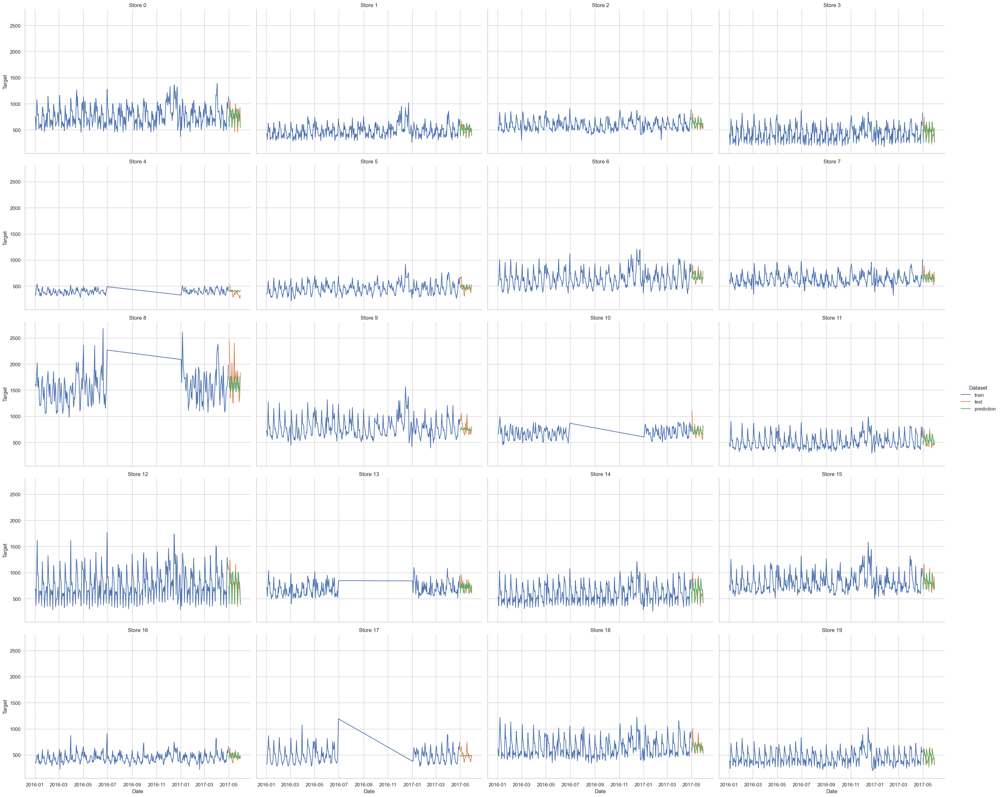

In [392]:
# Визуализация прогнозирования Prophet
df_train['dataset'] = 'train'
df_test['dataset'] = 'test'
final_predictions['dataset'] = 'prediction'

final_predictions = final_predictions.rename(columns={"ds": "date", "yhat": "target"})

df_combined = pd.concat([df_train, df_test, final_predictions], ignore_index=True)

g = sns.FacetGrid(df_combined, col="store_id", col_wrap=4, height=5, aspect=1.5)

g.map_dataframe(sns.lineplot, x="date", y="target", hue="dataset")

g.set_axis_labels("Date", "Target")
g.set_titles("Store {col_name}")
g.add_legend(title='Dataset')
g.tight_layout()

plt.show()

df_train = df_train.drop(columns=["dataset"])
df_test = df_test.drop(columns=["dataset"])
final_predictions = final_predictions.drop(columns=["dataset"])

#### Метрики Prophet на отложенной выборке
0.6291025031813067 довольно плохой результат. Постараюсь его улучшить

In [393]:
# Оставляю в предикте только те дни, что есть в тесте
y_test = df_test[df_test["store_id"] == store_id][["date", "target"]]
y_pred = final_predictions[final_predictions["store_id"] == store_id][["date", "target"]]

merged = pd.merge(y_test, y_pred, on="date", suffixes=('_true', '_pred'))

y_true = merged["target_true"]
y_pred_filtered = merged["target_pred"]

y_pred_filtered

0     311.499070
1     565.933624
2     518.542685
3     476.573521
4     471.549682
5     434.307748
6     311.759153
7     566.193707
8     518.802767
9     476.833603
10    434.567831
11    312.019235
12    566.453789
13    519.062850
14    477.093686
15    472.069847
16    434.827913
17    312.279318
18    519.322932
19    477.353768
20    472.329929
21    435.087996
22    312.539400
Name: target_pred, dtype: float64

In [397]:
smae_sum = 0
for store_id in range(20):
    y_train = df_train[df_train["store_id"] == store_id]["target"]
    y_test = df_test[df_test["store_id"] == store_id][["date", "target"]]
    y_pred = final_predictions[final_predictions["store_id"] == store_id][["date", "target"]]

    # В тесте нет всех значений, поэтому оставлю в прогнозе только те дни, что есть в тесте
    merged = pd.merge(y_test, y_pred, on="date", suffixes=('_true', '_pred'))
    y_test = merged["target_true"].values
    y_pred_filtered = merged["target_pred"].values

    smae_sum += sMAE(y_true=y_test, y_pred=y_pred_filtered)
smae = smae_sum / 20

In [398]:
smae

0.6291025031813067

### Глобальная модель
Буду использовать одну глобальную, Multi-series, модель, потому что, как было написано в EDA, ряды связаны между собой и извлечение общего паттерна может помочь в прогнозировании и уменьшении переобучения. К тому же это уменьшит время на обучение и подбор гиперпараметров. Я буду использовать рекурсивную модель на основе бустинга LightGBM, к которой я подобрал на отложенной, валидационной, выборке. Вместо заполнения пропусков буду использовать модель, которая умеет работать с большим количеством пропущенных значений.
Для этого буду использовать относительно новую библиотеку skforecast, которая сейчас быстро развивается и имеет на редкость хорошую для временных рядов документацию.
#### Заполнение пропусков с помощью Prophet и её гиперпараметров, подобранных выше
Хоть в данных на месте пропусков скорее всего лежат нули, всё равно буду заполнять эти пропуски с помощью prophet в целях уменьшения переобучения модели

In [40]:
def reindex_store(group):
    # Создаем полный диапазон дат от минимальной до максимальной даты для каждого магазина
    full_date_range = pd.date_range(start=group['date'].min(), end=group['date'].max(), freq='D')
    # Переиндексируем группу, чтобы включить все даты в диапазоне и добавить NaN для отсутствующих строк
    group = group.set_index('date').reindex(full_date_range).reset_index()
    group = group.rename(columns={'index': 'date'})
    # Добавляем колонку 'store_id', заполняя её идентификатором магазина
    group['store_id'] = group['store_id'].iloc[0]

    return group

In [41]:
# повторное чтение данных
train = pd.read_excel("train.xlsx")
test = pd.read_excel("test.xlsx")

train["dt"] = pd.to_datetime(train['dt'])
test["dt"] = pd.to_datetime(test['dt'])
train["id"] = train['id'].astype(str)
test["id"] = test['id'].astype(str)

train = train.rename(columns={"id": "store_id", "dt": "date"})
test = test.rename(columns={"id": "store_id", "dt": "date"})

In [42]:
# Отдельно заполню медианой большой пропуск в магазине 17, так как интерполяция мне не понравилась.
df_complete = train.groupby('store_id').apply(reindex_store).reset_index(drop=True)

df_gap_filled = df_complete.copy()

void_start_date = '2016-07-01'
void_end_date = '2017-01-01'
store_id_to_fill = 17

mask = (df_gap_filled['store_id'] == store_id_to_fill) & (df_gap_filled['date'] >= void_start_date) & (
            df_gap_filled['date'] <= void_end_date)

df_gap_filled.loc[mask, 'target'] = df_gap_filled.loc[~mask, 'target'].median()

In [43]:
# Гиперпараметры модели Prophet, подобранные выше
best_params_by_store = {0: {'changepoint_prior_scale': 0.2505,
                            'seasonality_prior_scale': 2.5075,
                            'holidays_prior_scale': 0.01,
                            'seasonality_mode': 'additive',
                            'changepoint_range': 0.95},
                        1: {'changepoint_prior_scale': 0.5,
                            'seasonality_prior_scale': 2.5075,
                            'holidays_prior_scale': 0.01,
                            'seasonality_mode': 'additive',
                            'changepoint_range': 0.5},
                        2: {'changepoint_prior_scale': 0.5,
                            'seasonality_prior_scale': 7.5024999999999995,
                            'holidays_prior_scale': 0.01,
                            'seasonality_mode': 'additive',
                            'changepoint_range': 0.5},
                        3: {'changepoint_prior_scale': 0.5,
                            'seasonality_prior_scale': 5.005,
                            'holidays_prior_scale': 0.01,
                            'seasonality_mode': 'multiplicative',
                            'changepoint_range': 0.5},
                        4: {'changepoint_prior_scale': 0.5,
                            'seasonality_prior_scale': 0.01,
                            'holidays_prior_scale': 0.01,
                            'seasonality_mode': 'multiplicative',
                            'changepoint_range': 0.5},
                        5: {'changepoint_prior_scale': 0.2505,
                            'seasonality_prior_scale': 5.005,
                            'holidays_prior_scale': 0.01,
                            'seasonality_mode': 'additive',
                            'changepoint_range': 0.725},
                        6: {'changepoint_prior_scale': 0.12575,
                            'seasonality_prior_scale': 7.5024999999999995,
                            'holidays_prior_scale': 0.01,
                            'seasonality_mode': 'multiplicative',
                            'changepoint_range': 0.95},
                        7: {'changepoint_prior_scale': 0.2505,
                            'seasonality_prior_scale': 2.5075,
                            'holidays_prior_scale': 0.01,
                            'seasonality_mode': 'multiplicative',
                            'changepoint_range': 0.5},
                        8: {'changepoint_prior_scale': 0.001,
                            'seasonality_prior_scale': 2.5075,
                            'holidays_prior_scale': 0.01,
                            'seasonality_mode': 'multiplicative',
                            'changepoint_range': 0.725},
                        9: {'changepoint_prior_scale': 0.12575,
                            'seasonality_prior_scale': 0.01,
                            'holidays_prior_scale': 0.01,
                            'seasonality_mode': 'multiplicative',
                            'changepoint_range': 0.725},
                        10: {'changepoint_prior_scale': 0.5,
                             'seasonality_prior_scale': 10.0,
                             'holidays_prior_scale': 0.01,
                             'seasonality_mode': 'multiplicative',
                             'changepoint_range': 0.5},
                        11: {'changepoint_prior_scale': 0.12575,
                             'seasonality_prior_scale': 7.5024999999999995,
                             'holidays_prior_scale': 0.01,
                             'seasonality_mode': 'additive',
                             'changepoint_range': 0.5},
                        12: {'changepoint_prior_scale': 0.2505,
                             'seasonality_prior_scale': 7.5024999999999995,
                             'holidays_prior_scale': 0.01,
                             'seasonality_mode': 'additive',
                             'changepoint_range': 0.725},
                        13: {'changepoint_prior_scale': 0.12575,
                             'seasonality_prior_scale': 7.5024999999999995,
                             'holidays_prior_scale': 0.01,
                             'seasonality_mode': 'multiplicative',
                             'changepoint_range': 0.5},
                        14: {'changepoint_prior_scale': 0.001,
                             'seasonality_prior_scale': 5.005,
                             'holidays_prior_scale': 0.01,
                             'seasonality_mode': 'multiplicative',
                             'changepoint_range': 0.725},
                        15: {'changepoint_prior_scale': 0.37525,
                             'seasonality_prior_scale': 10.0,
                             'holidays_prior_scale': 0.01,
                             'seasonality_mode': 'multiplicative',
                             'changepoint_range': 0.95},
                        16: {'changepoint_prior_scale': 0.5,
                             'seasonality_prior_scale': 7.5024999999999995,
                             'holidays_prior_scale': 0.01,
                             'seasonality_mode': 'multiplicative',
                             'changepoint_range': 0.5},
                        17: {'changepoint_prior_scale': 0.12575,
                             'seasonality_prior_scale': 0.01,
                             'holidays_prior_scale': 0.01,
                             'seasonality_mode': 'multiplicative',
                             'changepoint_range': 0.5},
                        18: {'changepoint_prior_scale': 0.37525,
                             'seasonality_prior_scale': 0.01,
                             'holidays_prior_scale': 0.01,
                             'seasonality_mode': 'additive',
                             'changepoint_range': 0.725},
                        19: {'changepoint_prior_scale': 0.12575,
                             'seasonality_prior_scale': 10.0,
                             'holidays_prior_scale': 0.01,
                             'seasonality_mode': 'additive',
                             'changepoint_range': 0.5}}

In [44]:
# Заполнение пропусков
train_filled = pd.DataFrame(columns=df_gap_filled.columns)

for store_id in range(20):
    current_store = df_gap_filled[df_gap_filled["store_id"] == str(store_id)]
    transformer = Imputer(method="forecaster", forecaster=Prophet(**best_params_by_store[store_id]))

    transformer.fit(current_store["target"])

    y_filled = transformer.transform(current_store["target"])

    current_store["target"] = y_filled.values

    train_filled = pd.concat([train_filled, current_store])
train_filled

cmdstanpy  DEBUG cmd: where.exe tbb.dll
cwd: None
cmdstanpy  DEBUG TBB already found in load path
prophet    INFO  Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
prophet    INFO  Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
cmdstanpy  DEBUG input tempfile: C:\Users\VLADIM~1\AppData\Local\Temp\tmp32i7d57k\vdrwqint.json
cmdstanpy  DEBUG input tempfile: C:\Users\VLADIM~1\AppData\Local\Temp\tmp32i7d57k\s6zgs81j.json
cmdstanpy  DEBUG idx 0
cmdstanpy  DEBUG running CmdStan, num_threads: None
cmdstanpy  DEBUG CmdStan args: ['C:\\Programs\\anaconda\\envs\\dl\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=21839', 'data', 'file=C:\\Users\\VLADIM~1\\AppData\\Local\\Temp\\tmp32i7d57k\\vdrwqint.json', 'init=C:\\Users\\VLADIM~1\\AppData\\Local\\Temp\\tmp32i7d57k\\s6zgs81j.json', 'output', 'file=C:\\Users\\VLADIM~1\\AppData\\Local\\Temp\\tmp32i7d57k\\prophet_modeluxbgq_qm\\prophet_model-

,date,store_id,target
0,2016-01-02,0,747.800000
1,2016-01-03,0,681.200000
2,2016-01-04,0,505.800000
3,2016-01-05,0,518.865496
4,2016-01-06,0,1078.300000
...,...,...,...
6175,2017-05-26,19,437.800000
6176,2017-05-27,19,423.800000
6177,2017-05-28,19,450.800000
6178,2017-05-29,19,409.000000


#### Кластеризация рядов по признакам всего ряда
Кластеризую ряды, для создания дополнительный экзогенных фич
Не стану обучать разные модели для разных классов, поскольку рядов слишком мало
(А ещё потому, что это только ухудшило качество, когда я тестировал обучение по кластерам)
Вынес эту часть из EDA, поскольку она требует предварительной предобработки (заполнение пропусков)

In [47]:
# С помощью библиотеки tsfresh извлеку фичи всего ряда
ts_features = extract_features(
    timeseries_container=train_filled[["date", 'store_id', "target"]],
    column_id="store_id",
    column_value="target",
    default_fc_parameters=ComprehensiveFCParameters(),
    impute_function=tsfresh.utilities.dataframe_functions.impute,
    n_jobs=4
)

print("Shape of ts_features:", ts_features.shape)
ts_features.head(3)  # индексы не по порядку

tsfresh.feature_extraction.settings WARNING Dependency not available for matrix_profile, this feature will be disabled!
Feature Extraction: 100%|██████████| 20/20 [00:07<00:00,  2.60it/s]


Shape of ts_features: (20, 783)


,target__variance_larger_than_standard_deviation,target__has_duplicate_max,target__has_duplicate_min,target__has_duplicate,target__sum_values,target__abs_energy,target__mean_abs_change,target__mean_change,target__mean_second_derivative_central,target__median,...,target__fourier_entropy__bins_5,target__fourier_entropy__bins_10,target__fourier_entropy__bins_100,target__permutation_entropy__dimension_3__tau_1,target__permutation_entropy__dimension_4__tau_1,target__permutation_entropy__dimension_5__tau_1,target__permutation_entropy__dimension_6__tau_1,target__permutation_entropy__dimension_7__tau_1,target__query_similarity_count__query_None__threshold_0.0,target__mean_n_absolute_max__number_of_maxima_7
0,1.0,0.0,0.0,1.0,388902.137294,3.117608e+08,142.082651,-0.180156,-0.200682,726.5,...,0.284235,0.513138,1.936035,1.752916,2.959452,4.114112,4.968623,5.514199,0.0,1328.371429
1,1.0,0.0,0.0,1.0,242269.876008,1.211426e+08,90.068775,0.031907,-0.087719,448.1,...,0.312248,0.572329,1.953726,1.765023,2.989733,4.249556,5.161839,5.736973,0.0,898.257143
10,1.0,0.0,0.0,1.0,382025.565670,2.898414e+08,60.140268,0.334047,0.225341,762.7,...,0.204871,0.305728,1.273544,1.674862,2.790461,3.867274,4.636019,5.006896,0.0,963.834399


In [48]:
# Сделаю отбор фичей с помощью функции select_features из того же tsfresh
target = (
    train_filled.groupby('store_id')['target'].mean()
    .reindex(ts_features.index)
)

ts_features_selected = select_features(
    X=ts_features,
    y=target,
    fdr_level=0.001
)

ts_features_selected.index.name = 'building_id'
print(f"Number of features before selection: {ts_features.shape[1]}")
print(f"Number of features after selection: {ts_features_selected.shape[1]}")
ts_features_selected.head()

Number of features before selection: 783
Number of features after selection: 57


,target__sum_values,"target__fft_coefficient__attr_""abs""__coeff_0","target__fft_coefficient__attr_""real""__coeff_0",target__mean,"target__agg_linear_trend__attr_""intercept""__chunk_len_5__f_agg_""mean""","target__linear_trend__attr_""intercept""",target__c3__lag_2,target__c3__lag_3,"target__agg_linear_trend__attr_""intercept""__chunk_len_10__f_agg_""mean""","target__agg_linear_trend__attr_""intercept""__chunk_len_50__f_agg_""mean""",...,"target__cwt_coefficients__coeff_10__w_10__widths_(2, 5, 10, 20)","target__agg_linear_trend__attr_""intercept""__chunk_len_50__f_agg_""min""","target__agg_linear_trend__attr_""intercept""__chunk_len_10__f_agg_""max""","target__cwt_coefficients__coeff_11__w_10__widths_(2, 5, 10, 20)","target__cwt_coefficients__coeff_1__w_10__widths_(2, 5, 10, 20)","target__cwt_coefficients__coeff_6__w_20__widths_(2, 5, 10, 20)","target__cwt_coefficients__coeff_12__w_10__widths_(2, 5, 10, 20)","target__cwt_coefficients__coeff_8__w_5__widths_(2, 5, 10, 20)","target__cwt_coefficients__coeff_13__w_10__widths_(2, 5, 10, 20)","target__agg_linear_trend__attr_""intercept""__chunk_len_10__f_agg_""min"""
building_id,,,,,,,,,,,,,,,,,,,,,
0,388902.137294,388902.137294,388902.137294,755.149781,714.802654,714.472031,4.353164e+08,4.397493e+08,715.769994,723.595516,...,1054.608133,465.577273,1029.601669,1011.793485,302.581034,690.085829,951.630937,729.157425,878.488548,502.616079
1,242269.876008,242269.876008,242269.876008,470.426944,431.264815,430.976388,1.073295e+08,1.080807e+08,432.234339,437.227507,...,653.409802,285.400000,622.368238,634.459397,153.537738,438.775654,604.386014,421.331029,565.546195,306.559796
10,382025.565670,382025.565670,382025.565670,741.797215,706.945469,706.651391,4.222703e+08,4.209980e+08,709.685455,717.362383,...,1141.298588,546.506611,833.772016,1092.936183,370.122185,795.987593,1025.553605,766.524276,943.601182,609.560668
11,259226.592324,259226.592324,259226.592324,503.352606,474.072140,473.816773,1.312473e+08,1.291542e+08,475.271532,477.499944,...,793.277312,315.568182,732.139115,755.388635,272.416522,557.088166,704.764204,561.045100,644.789695,353.122961
12,374812.016350,374812.016350,374812.016350,727.790323,672.198264,671.710202,3.645200e+08,3.859277e+08,675.113321,687.252026,...,1194.799802,310.068182,1209.228374,1159.871426,270.167724,816.492569,1102.794534,926.485677,1027.828921,338.387658


In [49]:
# Отскалирую получившиеся фичи
scaler = StandardScaler().set_output(transform="pandas")
ts_features_selected_scaled = scaler.fit_transform(ts_features_selected)
ts_features_selected_scaled.head(2)

,target__sum_values,"target__fft_coefficient__attr_""abs""__coeff_0","target__fft_coefficient__attr_""real""__coeff_0",target__mean,"target__agg_linear_trend__attr_""intercept""__chunk_len_5__f_agg_""mean""","target__linear_trend__attr_""intercept""",target__c3__lag_2,target__c3__lag_3,"target__agg_linear_trend__attr_""intercept""__chunk_len_10__f_agg_""mean""","target__agg_linear_trend__attr_""intercept""__chunk_len_50__f_agg_""mean""",...,"target__cwt_coefficients__coeff_10__w_10__widths_(2, 5, 10, 20)","target__agg_linear_trend__attr_""intercept""__chunk_len_50__f_agg_""min""","target__agg_linear_trend__attr_""intercept""__chunk_len_10__f_agg_""max""","target__cwt_coefficients__coeff_11__w_10__widths_(2, 5, 10, 20)","target__cwt_coefficients__coeff_1__w_10__widths_(2, 5, 10, 20)","target__cwt_coefficients__coeff_6__w_20__widths_(2, 5, 10, 20)","target__cwt_coefficients__coeff_12__w_10__widths_(2, 5, 10, 20)","target__cwt_coefficients__coeff_8__w_5__widths_(2, 5, 10, 20)","target__cwt_coefficients__coeff_13__w_10__widths_(2, 5, 10, 20)","target__agg_linear_trend__attr_""intercept""__chunk_len_10__f_agg_""min"""
building_id,,,,,,,,,,,,,,,,,,,,,
0,0.358456,0.358456,0.358456,0.358456,0.360175,0.360252,-0.068547,-0.062881,0.354626,0.361608,...,0.130786,0.213640,0.499475,0.113365,0.240249,0.026577,0.095353,0.260307,0.077159,0.134780
1,-0.681349,-0.681349,-0.681349,-0.681349,-0.753644,-0.754069,-0.371142,-0.370910,-0.753577,-0.748219,...,-0.743741,-0.619856,-0.870983,-0.742637,-0.711099,-0.737873,-0.741722,-0.880433,-0.741260,-0.680544


In [50]:
# PCA для уменьшения количества параметров до 5
pca = PCA(n_components=0.995)
pca_projections = pca.fit_transform(ts_features_selected_scaled)

pca_projections = pd.DataFrame(
    pca_projections,
    index=ts_features_selected_scaled.index,
    columns=[f"PC{i}" for i in range(1, pca.n_components_ + 1)]
)

print(f"Количество компонентов: {pca.n_components_}")
print(f"Explained variance: {pca.explained_variance_ratio_.sum():.3f}")
pca_projections.head(3)

Количество компонентов: 5
Explained variance: 0.997


,PC1,PC2,PC3,PC4,PC5
building_id,,,,,
0,1.813755,0.643858,0.156791,0.669919,0.376461
1,-5.312426,-0.500790,0.383692,-0.282274,0.165330
10,2.398643,-0.657622,-0.802160,0.827487,-0.175828


Для определения оптимального количества кластеров буду использовать метод «локтя» (elbow method).
В данном случае внутрикластерная дисперсия резко уменьшается с 1 до 4, а потом меняется слабо, поэтому я остановлюсь на 4-х кластерах.

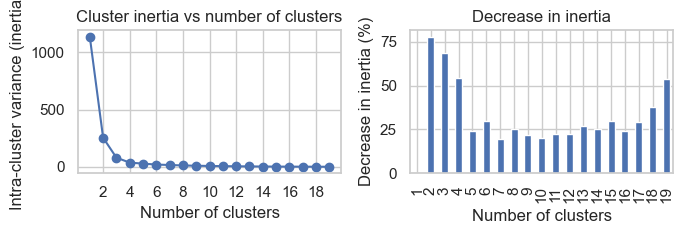

In [51]:
# Кластеризация методом k-means
range_n_clusters = range(1, 20)
inertias = []
size_of_clusters = []

for n_clusters in range_n_clusters:
    kmeans = KMeans(
        n_clusters=n_clusters,
        n_init=20,
        random_state=963852
    )
    kmeans.fit(pca_projections)
    inertias.append(kmeans.inertia_)
    size_of_clusters.append(list(np.unique(kmeans.labels_, return_counts=True)[1]))

inertias = pd.Series(inertias, index=range_n_clusters)
dicrease_in_inertia = inertias.pct_change() * -100

fig, axs = plt.subplots(1, 2, figsize=(7, 2.5))
inertias.plot(marker='o', ax=axs[0])
axs[0].xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
axs[0].set_title("Cluster inertia vs number of clusters")
axs[0].set_xlabel('Number of clusters')
axs[0].set_ylabel('Intra-cluster variance (inertia)')

dicrease_in_inertia.plot(kind='bar', ax=axs[1])
axs[1].set_title("Decrease in inertia")
axs[1].set_xlabel('Number of clusters')
axs[1].set_ylabel('Decrease in inertia (%)')
fig.tight_layout()
plt.show();

In [52]:
# Возьму 4 кластера
kmeans = KMeans(n_clusters=4, n_init=20, random_state=123)
kmeans.fit(pca_projections)
clusters = kmeans.predict(pca_projections)
clusters = pd.DataFrame({
    'store_id': pca_projections.index,
    'cluster_base_on_features': clusters.astype(str)
})


In [53]:
clusters # кластер для каждого магазина

,store_id,cluster_base_on_features
0,0,2
1,1,3
2,10,2
3,11,0
4,12,2
5,13,2
6,14,0
7,15,2
8,16,3
9,17,0


In [54]:
# Объединю получившиеся кластера с изначальрными данными
train_clustered = pd.merge(
    train.reset_index(),
    clusters,
    on='store_id',
    how='left',
    validate='m:1'
).set_index('index')

test_clustered = pd.merge(
    test.reset_index(),
    clusters,
    on='store_id',
    how='left',
    validate='m:1'
).set_index('index')

#### Создание Фичей
Про временные ряды нет никакой информации, поэтому в извлечении экзогенных признаков ограничусь созданием признаков времени с их циклической трансформацией. Также в качестве эксперимента добавлю информацию о Московском часов поясе. В случае, если не угадаю с часов поясом, фичи удалятся на этапе отбора признаков. 

In [56]:
def cyclical_encoding(data: pd.DataFrame, cycle_length: int, label: str) -> pd.DataFrame:
    '''
    Преобразует цикличные данные в синусоиду и косинусоиду для дальнейшего анализа.

    Эта функция используется для преобразования признаков с цикличными значениями (например, время суток, дни недели, месяцы) в два новых признака, которые могут быть использованы в машинном обучении. Преобразование выполняется с использованием синусоидальных и косинусоидальных функций для отображения циклической природы данных.

    Параметры:
    data (pd.DataFrame): Исходный DataFrame, содержащий колонку с цикличными данными.
    cycle_length (int): Длина цикла (например, 24 для часов в сутках или 365 для дней в году).
    label (str): Имя колонки в DataFrame, которая содержит цикличные данные, подлежащие преобразованию.

    Возвращаемое значение:
    pd.DataFrame: Новый DataFrame, содержащий два новых столбца — синусоидальную и косинусоидальную составляющие 
    преобразованного признака, и исходные данные без столбца `label`.
    
    Пример:
    ```
    data = pd.DataFrame({'hour': [0, 6, 12, 18]})
    result = cyclical_encoding(data, 24, 'hour')
    print(result)
    ```
    '''
    if cycle_length <= 0:
        return data
    data[f"{label}_sin"] = np.sin(2 * np.pi * data[label] / cycle_length)
    data[f"{label}_cos"] = np.cos(2 * np.pi * data[label] / cycle_length)
    data = data.drop(columns=[label])

    return data

In [57]:
def create_exg_features(data, label="date"):
    '''
    Генерация дополнительных временных признаков и циклического кодирования на основе данных о времени.
    
    Описание создаваемых признаков:
    - Признаки для различных аспектов даты и времени (месяц, квартал, неделя, день недели и т.д.)
    - Циклическое кодирование для каждого признака времени.
    - Время восхода и заката солнца для Москвы.
    - Продолжительность светового дня.
    
    Функция извлекает 
    Параметры:
    data (pd.DataFrame): Исходный DataFrame, содержащий колонку с временными данными (по умолчанию "date").
    label (str): Имя колонки в DataFrame, которая содержит временные данные. По умолчанию используется колонка "date".

    Возвращаемое значение:
    pd.DataFrame: Новый DataFrame, включающий извлеченные временные признаки

    Пример:
    ```
    data = pd.DataFrame({'date': ['2024-01-01', '2024-06-01', '2024-12-31']})
    result = create_exg_features(data)
    print(result)
    ```
    '''
    datetime_features_to_length = {
        'month': 12,
        'quarter': 4,
        'semester': 2,
        'week': 52,
        'day_of_week': 7,
        'day_of_month': 31,
        'weekend': 2,
        'month_start': 0,
        'month_end': 0,
        'quarter_start': 0,
        'quarter_end': 0,
        'year_start': 0,
        'year_end': 0,
        'leap_year': 0,
        'days_in_month': 0
    }

    label_store = data[label]

    # Фичи времени
    datetime_transformer = DatetimeFeatures(
        variables=label,
        features_to_extract=list(datetime_features_to_length.keys())
    )

    data = datetime_transformer.fit_transform(data)
    data[label] = label_store

    # Кодирование фич циклическим кодированием

    for k, v in datetime_features_to_length.items():
        data = cyclical_encoding(data, v, label + "_" + k)

    # Добавлю данные о местоположении. Буду надеяться, что магазины находятся в москве. 
    # Если нет - отброшу на этапе отбора фичей

    location = LocationInfo("Moscow", "Russia")
    sunrise_hour = [sun(location.observer, date=date)['sunrise'].hour for date in data[label]]
    sunset_hour = [sun(location.observer, date=date)['sunset'].hour for date in data[label]]

    data['sunrise_hour'] = sunrise_hour
    data['sunset_hour'] = sunset_hour
    data['daylight_hours'] = data['sunset_hour'] - data['sunrise_hour']

    return data

In [58]:
exog = train_clustered.copy()
exog = create_exg_features(exog)
# Дропну кластер и добавлю его после отбора фичей
exog = exog.drop(columns=["target", "cluster_base_on_features"])
exog

,store_id,date_month_start,date_month_end,date_quarter_start,date_quarter_end,date_year_start,date_year_end,date_leap_year,date_days_in_month,date,...,date_week_cos,date_day_of_week_sin,date_day_of_week_cos,date_day_of_month_sin,date_day_of_month_cos,date_weekend_sin,date_weekend_cos,sunrise_hour,sunset_hour,daylight_hours
index,,,,,,,,,,,,,,,,,,,,,
0,0,0,0,0,0,0,0,1,31,2016-01-02,...,0.992709,-0.974928,-0.222521,0.394356,0.918958,1.224647e-16,-1.0,8,16,8
1,0,0,0,0,0,0,0,1,31,2016-01-03,...,0.992709,-0.781831,0.623490,0.571268,0.820763,1.224647e-16,-1.0,8,16,8
2,0,0,0,0,0,0,0,1,31,2016-01-04,...,0.992709,0.000000,1.000000,0.724793,0.688967,0.000000e+00,1.0,8,16,8
3,0,0,0,0,0,0,0,1,31,2016-01-06,...,0.992709,0.974928,-0.222521,0.937752,0.347305,0.000000e+00,1.0,8,16,8
4,0,0,0,0,0,0,0,1,31,2016-01-07,...,0.992709,0.433884,-0.900969,0.988468,0.151428,0.000000e+00,1.0,8,16,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7720,19,0,0,0,0,0,0,0,31,2017-05-26,...,-0.822984,-0.433884,-0.900969,-0.848644,0.528964,0.000000e+00,1.0,3,20,17
7721,19,0,0,0,0,0,0,0,31,2017-05-27,...,-0.822984,-0.974928,-0.222521,-0.724793,0.688967,1.224647e-16,-1.0,3,20,17
7722,19,0,0,0,0,0,0,0,31,2017-05-28,...,-0.822984,-0.781831,0.623490,-0.571268,0.820763,1.224647e-16,-1.0,3,20,17


In [80]:
exog_test = test_clustered.copy()
exog_test = create_exg_features(exog_test)
exog_test = exog_test.drop(columns=["cluster_base_on_features"])

#### Отбор Фичей по кросс-валидации
отберу с помощью RFECV и LGBMRegressor

In [59]:
# Создание датасета skforecast
series_dict = series_long_to_dict(
    data=train_clustered,
    series_id='store_id',
    index='date',
    values='target',
    freq='D'
)

exog_dict = exog_long_to_dict(
    data=exog,
    series_id='store_id',
    index='date',
    freq='D'
)

In [82]:
exog_dict_forecasting = exog_long_to_dict(
    data=exog_test,
    series_id='store_id',
    index='date',
    freq='D'
)

In [60]:
regressor = LGBMRegressor(
    n_estimators=1000,
    random_state=123,
    max_depth=5,
    verbose=-1
)

forecaster = ForecasterAutoregMultiSeries(
    regressor=regressor,
    lags=32,
    encoding="ordinal",
    dropna_from_series=False
)

In [61]:
# отбор с помощью LightGBM и RFECV
regressor = LGBMRegressor(n_estimators=500, max_depth=5, random_state=123, verbose=-1)
selector = RFECV(
    estimator=regressor, step=1, cv=5, min_features_to_select=10, n_jobs=-1
)

selected_autoreg, selected_exog = select_features_multiseries(
    forecaster=forecaster,
    selector=selector,
    series=series_dict,
    exog=exog_dict,
    select_only=None,
    force_inclusion=None,
    subsample=0.5,
    random_state=123,
    verbose=True,
)

Recursive feature elimination (RFECV)
-------------------------------------
Total number of records available: 7192
Total number of records used for feature selection: 65963
Number of features available: 57
    Autoreg (n=32)
    Exog    (n=25)
Number of features selected: 52
    Autoreg (n=32) : [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32]
    Exog    (n=20) : ['date_month_start', 'date_month_end', 'date_quarter_start', 'date_quarter_end', 'date_year_end', 'date_leap_year', 'date_days_in_month', 'date_month_sin', 'date_month_cos', 'date_quarter_sin', 'date_quarter_cos', 'date_week_sin', 'date_week_cos', 'date_day_of_week_sin', 'date_day_of_week_cos', 'date_day_of_month_sin', 'date_day_of_month_cos', 'sunrise_hour', 'sunset_hour', 'daylight_hours']


Также добавляю к экзогенным данным номер их кластера с помощью one-hot кодирования. Не буду обучать для каждого кластера свою модель, поскольку в каждом кластере слишком мало рядов (от 1 до 7). Делаю это после отбора признаков, чтобы точно не удалить их на предыдущем этапе.

In [87]:
# train
total_clusters = len(clusters["cluster_base_on_features"].unique())
for store_id in range(20):
    # One-hot кодирование кластеров
    current_store_cluster = clusters[clusters["store_id"] == str(store_id)]["cluster_base_on_features"].values[0]

    # Добавление в словарь данных
    for current_cluster in range(total_clusters):
        # train
        exog_dict[str(store_id)]["is_cluster_" + str(current_cluster)] = 1 if (
                    str(current_cluster) == current_store_cluster) else 0
        # test
        exog_dict_forecasting[str(store_id)]["is_cluster_" + str(current_cluster)] = 1 if (
                    str(current_cluster) == current_store_cluster) else 0

#### Baseline модели

In [65]:
# Снова убираю последний месяц обучающей выборки для валидации
end_train = '2017-05-01'

series_dict_train = {k: v.loc[: end_train, ] for k, v in series_dict.items()}
exog_dict_train = {k: v[selected_exog].loc[: end_train, ] for k, v in exog_dict.items()}
series_dict_test = {k: v.loc[end_train:, ] for k, v in series_dict.items()}
exog_dict_test = {k: v[selected_exog].loc[end_train:, ] for k, v in exog_dict.items()}

In [419]:
# Буду использовать LGBMRegressor дя рекурсивной глобальной модели
regressor = LGBMRegressor(
    n_estimators=2000,
    random_state=123,
    max_depth=5,
    verbose=-1
)

forecaster = ForecasterAutoregMultiSeries(
    regressor=regressor,
    lags=64,
    encoding="ordinal",
    dropna_from_series=False,
)

forecaster.fit(series=series_dict_train, exog=exog_dict_train, suppress_warnings=True)
forecaster

ForecasterAutoregMultiSeries 
Regressor: LGBMRegressor(max_depth=5, n_estimators=2000, random_state=123, verbose=-1) 
Lags: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48
 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64] 
Transformer for series: None 
Transformer for exog: None 
Series encoding: ordinal 
Window size: 64 
Series levels (names): 0, 1, 10, 11, 12, ... 
Series weights: None 
Weight function included: False 
Differentiation order: None 
Exogenous included: True 
Type of exogenous variable: <class 'dict'> 
Exogenous variables names: date_month_start, date_month_end, date_quarter_start, date_quarter_end, date_year_end, ... 
Training range: '0': ['2016-01-02', '2017-05-01'], '1': ['2016-01-02', '2017-05-01'], '10': ['2016-01-02', '2017-05-01'], ... 
Training index type: DatetimeIndex 
Training index frequency: D 
Regressor parameters: boosting_type: gbdt, class_weight: None, cols

In [420]:
# Проверка результатов на бэктрэкинге (кросс-валидация)
metrics_levels, backtest_predictions = backtesting_forecaster_multiseries(
    forecaster=forecaster,
    series=series_dict,
    exog=exog_dict,
    steps=24,
    metric=sMAE,
    add_aggregated_metric=False,
    initial_train_size=len(series_dict_train["0"]),
    fixed_train_size=True,
    gap=0,
    allow_incomplete_fold=True,
    refit=False,
    n_jobs="auto",
    verbose=False,
    show_progress=True,
    suppress_warnings=True
)

display(metrics_levels)
print(metrics_levels["sMAE"].mean())

  0%|          | 0/2 [00:00<?, ?it/s]

,levels,sMAE
0,0,0.603694
1,1,0.561065
2,10,0.598773
3,11,0.519560
4,12,0.465902
5,13,0.648744
6,14,0.640021
7,15,0.635786
8,16,0.499853
9,17,0.553904


0.6024034304644987


#### Стэкинг 
Стэкинг не даёт существенных улучшений, но значительно увеличивает время обучения. Скорее всего будет лучше подобрать гиперпараметры бустинга подольше, чем пытаться настроить стэкинг.

In [435]:
params_elasticnet = {'alpha': 0.1, 'l1_ratio': 0.5}
params_lgbm = {'learning_rate': 0.1, 'max_depth': 5, 'random_state': 123, 'n_estimators': 2000, 'verbose': -1}
params_rf = {'n_estimators': 100, 'max_depth': 7, 'random_state': 123}
params_knn = {'n_neighbors': 5}
params_mlp = {'hidden_layer_sizes': (64, 32), 'max_iter': 500, 'random_state': 123}
params_svr = {'kernel': 'rbf', 'C': 1.0, 'epsilon': 0.1}

estimators = [
    ('elastic', make_pipeline(SimpleImputer(strategy='median'), ElasticNet(**params_elasticnet))),
    ('lgbm', LGBMRegressor(**params_lgbm)),
    ('rf', RandomForestRegressor(**params_rf)),
    ('knn', make_pipeline(SimpleImputer(strategy='median'), KNeighborsRegressor(**params_knn))),
    ('svr', make_pipeline(SimpleImputer(strategy='median'), SVR(**params_svr)))
]

stacking_regressor = StackingRegressor(
    estimators=estimators,
    final_estimator=Ridge(),
    cv=KFold(n_splits=5, shuffle=True, random_state=42)
)

stacking_regressor

StackingRegressor(cv=KFold(n_splits=5, random_state=42, shuffle=True),
                  estimators=[('elastic',
                               Pipeline(steps=[('simpleimputer',
                                                SimpleImputer(strategy='median')),
                                               ('elasticnet',
                                                ElasticNet(alpha=0.1))])),
                              ('lgbm',
                               LGBMRegressor(max_depth=5, n_estimators=2000,
                                             random_state=123, verbose=-1)),
                              ('rf',
                               RandomForestRegressor(max_depth=7,
                                                     random_state=123)),
                              ('knn',
                               Pipeline(steps=[('simpleimputer',
                                                SimpleImputer(strategy='median')),
                                               ('kneighborsregressor',
                                                KNeighborsRegressor())])),
                              ('svr',
                               Pipeline(steps=[('simpleimputer',
                                                SimpleImputer(strategy='median')),
                                               ('svr', SVR())]))],
                  final_estimator=Ridge())

In [436]:
forecaster = ForecasterAutoregMultiSeries(
    regressor=stacking_regressor,
    lags=64,
    encoding="ordinal",
    dropna_from_series=False,
)

forecaster.fit(series=series_dict_train, exog=exog_dict_train, suppress_warnings=True)
forecaster

ForecasterAutoregMultiSeries 
Regressor: StackingRegressor(cv=KFold(n_splits=5, random_state=42, shuffle=True),
                  estimators=[('elastic',
                               Pipeline(steps=[('simpleimputer',
                                                SimpleImputer(strategy='median')),
                                               ('elasticnet',
                                                ElasticNet(alpha=0.1))])),
                              ('lgbm',
                               LGBMRegressor(max_depth=5, n_estimators=2000,
                                             random_state=123, verbose=-1)),
                              ('rf',
                               RandomForestRegressor(max_depth=7,
                                                     random_state=123)),
                              ('knn',
                               Pipeline(steps=[('simpleimputer',
                                                SimpleImputer(strategy='median')),
      

In [437]:
metrics_levels, backtest_predictions = backtesting_forecaster_multiseries(
    forecaster=forecaster,
    series=series_dict,
    exog=exog_dict,
    steps=24,
    metric=sMAE,
    add_aggregated_metric=False,
    initial_train_size=len(series_dict_train["0"]),
    fixed_train_size=True,
    gap=0,
    allow_incomplete_fold=True,
    refit=False,
    n_jobs="auto",
    verbose=False,
    show_progress=True,
    suppress_warnings=True
)

display(metrics_levels)
print(metrics_levels["sMAE"].mean())

  0%|          | 0/2 [00:00<?, ?it/s]

,levels,sMAE
0,0,0.572775
1,1,0.555475
2,10,0.574708
3,11,0.525119
4,12,0.462275
5,13,0.656692
6,14,0.627956
7,15,0.599517
8,16,0.507151
9,17,0.526230


0.5946042737692159


#### Подбор гиперпараметров
Ряды достаточно монотонны, поэтому не будет проблем в использовании отложенной выборки для подбора гиперпараметров, вместо кросс-валидации.

In [73]:
# Подбор гиперпараметров с использованием optuna и байесовского поиска
regressor = LGBMRegressor(
    random_state=123,
    n_estimators=1000,
    max_depth=5,
    min_data_in_leaf = 100,
    learning_rate=0.01,
    feature_fraction=0.5,
    max_bin=300,
    reg_alpha=0,
    reg_lambda=0,
    verbose      = -1
)

forecaster = ForecasterAutoregMultiSeries(
    regressor=regressor,
    lags=64,
    encoding='ordinal',
)

        

def search_space(trial):
    search_space = {
        'n_estimators'    : trial.suggest_int('n_estimators', 400, 6000, step=100),
        'max_depth'       : trial.suggest_int('max_depth', 3, 12, step=1),
        'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 25, 500),
        'learning_rate'   : trial.suggest_float('learning_rate', 0.001, 0.5),
        'feature_fraction': trial.suggest_float('feature_fraction', 0.5, 1, step=0.1),
        'max_bin'         : trial.suggest_int('max_bin', 50, 300, step=25),
        'reg_alpha'       : trial.suggest_float('reg_alpha', 0, 1, step=0.1),
        'reg_lambda'      : trial.suggest_float('reg_lambda', 0, 1, step=0.1),
        'lags'            : trial.suggest_int('lags', 7, 128)
    }

    return search_space


results, best_trial = bayesian_search_forecaster_multiseries(
    forecaster=forecaster,
    series=series_dict,
    exog=exog_dict,
    levels=None,
    search_space=search_space,
    n_trials=250, # 250 итераций
    steps=30, # 30 шагов как в тесте
    metric=sMAE,
    initial_train_size=len(series_dict_train["0"]),
    refit=False,
    fixed_train_size=False,
    return_best=True,
    verbose=False,
    show_progress=False
)

C:\Programs\anaconda\envs\dl\Lib\site-packages\skforecast\ForecasterAutoregMultiSeries\ForecasterAutoregMultiSeries.py:834: MissingValuesWarning: NaNs detected in `y_train`. They have been dropped because the target variable cannot have NaN values. Same rows have been dropped from `X_train` to maintain alignment. This is caused by series with interspersed NaNs. 
 You can suppress this warning using: warnings.simplefilter('ignore', category=MissingValuesWarning)
  warnings.warn(
C:\Programs\anaconda\envs\dl\Lib\site-packages\skforecast\ForecasterAutoregMultiSeries\ForecasterAutoregMultiSeries.py:856: MissingValuesWarning: NaNs detected in `X_train`. Some regressors do not allow NaN values during training. If you want to drop them, set `forecaster.dropna_from_series = True`. 
 You can suppress this warning using: warnings.simplefilter('ignore', category=MissingValuesWarning)
  warnings.warn(
C:\Programs\anaconda\envs\dl\Lib\site-packages\skforecast\utils\utils.py:853: MissingValuesWarnin

`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117 118] 
  Parameters: {'n_estimators': 3000, 'max_depth': 11, 'min_data_in_leaf': 55, 'learning_rate': 0.031027373560777095, 'feature_fraction': 0.5, 'max_bin': 150, 'reg_alpha': 0.4, 'reg_lambda': 0.0}
  Backtesting metric: 0.5643556093341189
  Levels: ['0', '1', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '2', '3', '4', '5', '6', '7', '8', '9']


In [74]:
# Кросс валидация результатов
metrics_levels, backtest_predictions = backtesting_forecaster_multiseries(
    forecaster=forecaster,
    series=series_dict,
    exog=exog_dict,
    steps=24,
    metric=sMAE,
    add_aggregated_metric=False,
    initial_train_size=len(series_dict_train["0"]),
    fixed_train_size=True,
    gap=0,
    allow_incomplete_fold=True,
    refit=False,
    n_jobs="auto",
    verbose=False,
    show_progress=True,
    suppress_warnings=True
)

display(metrics_levels)
print(metrics_levels["sMAE"].mean())

  0%|          | 0/2 [00:00<?, ?it/s]

,levels,sMAE
0,0,0.388978
1,1,0.538910
2,10,0.576192
3,11,0.549076
4,12,0.379278
5,13,0.647853
6,14,0.467613
7,15,0.472189
8,16,0.711892
9,17,0.476198


0.5405231343799811


⬆️Итоговый sMAE⬆️

### Test Forecast
Предскажу тестовую выборку

In [95]:
predictions = forecaster.predict(steps=31, exog=exog_dict_forecasting, suppress_warnings=True)
predictions

,0,1,10,11,12,13,14,15,16,17,18,19,2,3,4,5,6,7,8,9
2017-05-31,734.260799,540.485929,680.348936,589.107429,613.542307,635.413793,601.882858,741.143914,550.614568,584.736481,616.744088,508.709148,598.991059,506.150867,466.291699,566.345417,706.395548,694.744209,1192.137233,766.639412
2017-06-01,978.545036,670.940431,761.782624,746.826256,992.487915,801.451445,829.195069,1066.096667,598.457692,717.304694,817.830132,659.272585,717.262511,645.984763,421.020040,631.274058,867.883531,795.213692,1800.458549,1078.303271
2017-06-02,969.362445,622.400153,731.178597,729.336549,1057.534085,821.850991,803.797985,953.281271,521.440634,657.139270,824.817351,580.750882,726.291891,587.895455,390.523041,582.530189,817.792325,739.731150,1642.499365,959.291243
2017-06-03,888.715556,589.950261,766.546796,650.554615,870.983471,815.054265,796.341380,881.562671,530.250254,588.262341,810.165673,562.002108,729.847912,551.815562,402.058748,561.900830,811.627104,776.436117,1747.284225,929.620761
2017-06-04,957.062589,561.497139,726.521355,604.764625,943.565732,769.356506,709.258138,880.492859,513.917013,555.061525,743.482790,513.810310,679.452719,517.359428,396.059544,520.891023,709.682929,726.375327,1789.906098,847.605697
2017-06-05,929.344096,573.884953,731.950868,579.349727,840.426812,842.155450,709.369564,865.953958,544.156010,560.492599,741.641394,513.323751,711.920318,595.245571,389.441356,552.588054,776.443933,760.162451,2086.509682,842.977349
2017-06-06,567.808654,393.689473,840.164858,419.530446,442.161700,673.414125,417.397865,715.157234,431.962739,516.708919,576.676649,319.799621,547.881030,274.658324,415.950803,538.779421,715.308409,630.275103,1765.985277,740.659459
2017-06-07,692.111703,488.437097,675.045744,498.291517,610.463802,710.900424,545.744776,727.311636,465.894401,520.388892,611.453096,449.981464,588.845604,434.389016,437.010952,509.787004,677.574986,675.540785,1725.181514,703.719762
2017-06-08,691.435927,480.756840,645.363593,480.914335,712.591131,656.903105,603.447596,724.587737,421.526629,468.401549,593.565219,426.809697,613.975369,408.757301,359.015086,457.642753,591.928231,640.071412,1247.869637,664.930157
2017-06-09,718.299300,458.736018,620.256386,454.105250,712.862542,643.707573,561.770924,695.739872,371.020891,440.186528,567.220603,410.173132,566.792473,382.979723,337.038483,383.165555,540.302871,602.261060,1365.526950,648.618276


In [126]:
solution = predictions.reset_index().melt(id_vars='index')
solution = solution.rename(columns={"index": "dt", "variable": "id", "value": "target"})
solution = solution[solution['dt'] != '2017-05-31']
solution['id'] = pd.to_numeric(solution['id'])
solution = solution[['id', 'dt', 'target']]
solution['dt'] = pd.to_datetime(solution['dt'])
solution = solution.sort_values(by=['id', 'dt'])

In [127]:
solution

,id,dt,target
1,0,01.06.2017,978.545036
2,0,02.06.2017,969.362445
3,0,03.06.2017,888.715556
4,0,04.06.2017,957.062589
5,0,05.06.2017,929.344096
...,...,...,...
367,19,26.06.2017,388.638274
368,19,27.06.2017,321.382094
369,19,28.06.2017,463.685271
370,19,29.06.2017,571.085835


In [129]:
solution.to_excel("test.xlsx", index=False)

Проверка сохранения и визуализация форкаста

In [12]:
final_train = pd.read_excel("train.xlsx")
final_test = pd.read_excel("test.xlsx")

final_train['dt'] =pd.to_datetime(final_train['dt'])
final_test['dt'] =pd.to_datetime(final_test['dt'])

На первый взгляд выглядит неплохо, но метрики говорят сами за себя

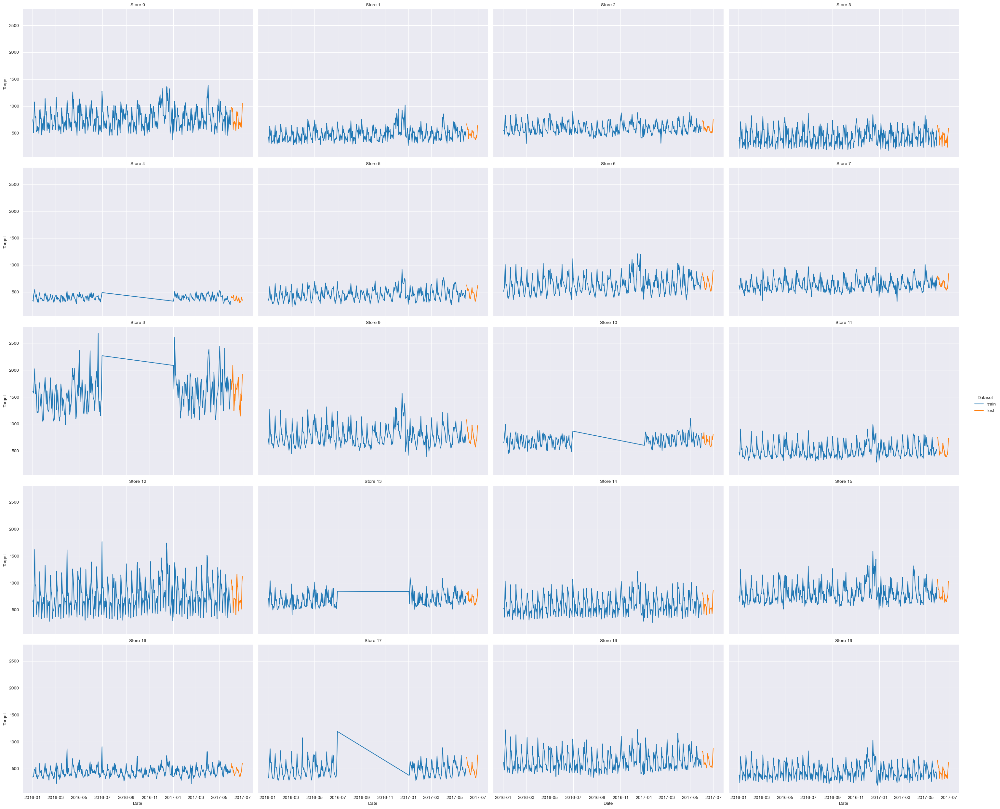

In [14]:

final_train['dataset'] = 'train'
final_test['dataset'] = 'test'

df_combined = pd.concat([final_train, final_test], ignore_index=True)

g = sns.FacetGrid(df_combined, col="id", col_wrap=4, height=5, aspect=1.5)

g.map_dataframe(sns.lineplot, x="dt", y="target", hue="dataset")

g.set_axis_labels("Date", "Target")
g.set_titles("Store {col_name}")
g.add_legend(title='Dataset')
g.tight_layout()

plt.show()

final_train = final_train.drop(columns=["dataset"])
final_test = final_test.drop(columns=["dataset"])

### Выводы
Во время выполнения задания:
  - проведён подробный EDA временных рядов
  - обучен бейзлайн с использованием Prophet, для которого были подобраны гиперпараметры на кросс валидации
  - Выделено и отобрано около 25 признаков
  - Ряды были кластеризованы для создания дополнительных признаков
  - Обучен глобальный рекурсивный бустинг с подбором гиперпараметров на отложенной выборке
  - Были получены метрики на кросс-валидации и спрогнозированы продажи на следующий месяц

В целом, на кросс-валидации были получены весьма скверные результаты: sMAE = 0.54. 
Я могу это оправдать небольшим количеством данных, наличием большого количества пропусков и отсутствии информации о датасете (не было даже информации о геолокации магазинов).

Что можно было бы улучшить:
- Добавить признаки нескольких стран и затем отобрать их, тем самым найдя нужную страну (например можно было добавить праздники)
- Добавить больше внешних данных, не привязанных к странам
- Попробовать больше вариантов моделей глубинного обучения, а не только Chronos, который я, скорее всего, использовал неправильно.
- Попробовать другие реализации бустинга (HistGradientBoostingRegressor, CatBoost, XGboost)
- Попробовать добавить больше моделей в стакинг и подбирать параметры для каждой модели большее число шагов
- Поэкспериментировать с различными вариантами предобработки данных